In [2]:
from alltools.machine_learning.convtools import conviter, compute_output_shape, align_kernel
import numpy as np
import matplotlib.pyplot as plt

In [7]:
X = np.array([
    [1, 0, 4, 2, 125, 67],
    [8, 2, 5, 4, 34, 12],
    [20, 13, 25, 15, 240, 2],
    [76, 8, 6, 6, 100, 76],
    [34, 66, 134, 223, 201, 3],
    [255, 123, 89, 55, 32, 2]
])

kern = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
])
out = np.zeros(compute_output_shape(X.shape, kern.shape, 1))
kern_aligned = align_kernel(X, kern)

for (p1, p2), (q1, q2), (k1, k2) in conviter(X.shape, kern.shape, 1):
    out[q1, q2] = (X[p1, p2]*kern_aligned[k1, k2]).sum()

out

array([[  22.,   27.,   36.,  313.,  722.,  576.],
       [  91.,  110.,  120.,  522.,  984.,  619.],
       [ 284.,  257.,  198.,  755., 1360.,  798.],
       [ 507.,  567.,  687., 1312., 1689.,  955.],
       [1061., 1288., 1496., 1911., 1659.,  702.],
       [1400., 1480., 1269., 1243.,  870.,  279.]])

In [14]:
for (p1, p2), (q1, q2), (k1, k2) in conviter((100, 1), (2,), 1):
    # out[q1, q2] = (X[p1, p2]*kern_aligned[k1, k2]).sum()
    print((p1, p2), (q1, q2), (k1, k2))


(slice(0, 1, None), slice(0, None, None)) (0, 0) (slice(-1, None, None), slice(0, None, None))
(slice(0, 2, None), slice(0, None, None)) (1, 0) (slice(-2, None, None), slice(0, None, None))
(slice(1, 3, None), slice(0, None, None)) (2, 0) (slice(None, 2, None), slice(0, None, None))
(slice(2, 4, None), slice(0, None, None)) (3, 0) (slice(None, 2, None), slice(0, None, None))
(slice(3, 5, None), slice(0, None, None)) (4, 0) (slice(None, 2, None), slice(0, None, None))
(slice(4, 6, None), slice(0, None, None)) (5, 0) (slice(None, 2, None), slice(0, None, None))
(slice(5, 7, None), slice(0, None, None)) (6, 0) (slice(None, 2, None), slice(0, None, None))
(slice(6, 8, None), slice(0, None, None)) (7, 0) (slice(None, 2, None), slice(0, None, None))
(slice(7, 9, None), slice(0, None, None)) (8, 0) (slice(None, 2, None), slice(0, None, None))
(slice(8, 10, None), slice(0, None, None)) (9, 0) (slice(None, 2, None), slice(0, None, None))
(slice(9, 11, None), slice(0, None, None)) (10, 0) (slice

In [2]:
def gaussian_random_walk(n: int, stepsize: float = 1.0) -> np.ndarray:
    """
    Generates a Gaussian random walk for a given number of points using numpy.

    Args:
        n: the number of points in the random walk
        stepsize: the standard deviation of the Gaussian distribution used to generate the random steps (default is 1.0)

    Returns:
        A numpy array of shape (n, 2) representing the x and y coordinates of the random walk.
    """
    # Generate random steps using a Gaussian distribution
    steps = np.random.normal(loc=0, scale=stepsize, size=(n, 2))

    # Compute the coordinates of the random walk by cumulatively summing the steps
    walk = np.cumsum(steps, axis=0)

    return walk.T[0]

In [ ]:
import torch.nn as nn
import torch.nn.init as init
import math
import torch

class DoobleWindowEstimator1D(nn.Module):
    def __init__(self, in_channels, out_channels, window_size, overlap=0, stride=1, padding=0, bias=True):
        super().__init__()
        self.window_size = window_size
        self.overlap = overlap
        self.stride = stride
        self.padding = padding
        self.weight = nn.Parameter(torch.empty(window_size, in_channels, out_channels))

        if bias:
            self.bias = nn.Parameter(torch.empty(out_channels))
        else:
            self.register_parameter('bias', None)

        self.reset_parameters()

    def reset_parameters(self) -> None:
        init.kaiming_uniform_(self.weight, a=math.sqrt(5))
        if self.bias is not None:
            fan_in, _ = init._calculate_fan_in_and_fan_out(self.weight)
            if fan_in != 0:
                bound = 1 / math.sqrt(fan_in)
                init.uniform_(self.bias, -bound, bound)

    def compute_n_windows(self, inputs):
        X = torch.permute(inputs, (0, 3, 1, 2))
        X_part1 = X[:, :-(self.window_size - self.overlap), :, :]
        convargs = ((X_part1.shape[1], X_part1.shape[0], X_part1.shape[2], X_part1.shape[3]), self.window_size, self.padding, self.stride)
        return compute_output_shape(*convargs)[0]

    def forward(self, inputs):
        # inputs shape (N_batch, in_channels, height, width) ~ (N_batch, 1, n_channels=1, n_times)
        X = torch.permute(inputs, (0, 3, 1, 2)).float() # ~ (N_batch, n_times, 1, n_channels=1)
        X_part1 = X[:, :-(self.window_size - self.overlap), :, :] # shape: (batches, times, 1, 1)
        X_part2 = X[:, self.window_size - self.overlap:, :, :]
        assert X_part1.shape == X_part2.shape, f'Windowed sequence is corrupted: {X_part1.shape} vs {X_part2.shape}'
        convargs = ((X_part1.shape[1], X_part1.shape[0], X_part1.shape[2], X_part1.shape[3]), self.window_size, self.padding, self.stride)
        n_windows = compute_output_shape(*convargs)[0]
        out_tensor = torch.zeros(X.shape[0], n_windows, 1, self.weight.shape[-1])

        for p, q, k in conviter(*convargs):
            # p shape: n_times, ...
            # print(p)
            window1 = X_part1[:, p[0], :, :]
            window2 = X_part2[:, p[0], :, :]
            # k shape: [window_dim, out_channels, in_channels, n_batches]
            weight = self.weight[k[:-1]]
            proj1 = torch.matmul(window1, weight) # shape ~ [batch, window, 1, out_channels]
            proj2 = torch.matmul(window2, weight)
            cov = torch.mean((proj1 - torch.mean(proj1, 1, keepdims=True))*(proj2 - torch.mean(proj2, 1, keepdims=True)), 1)
            # print(torch.squeeze(proj1 - torch.mean(proj1, 1, keepdims=True))*(proj2 - torch.mean(proj2, 1, keepdims=True)))
            out_tensor[:, q[0]] = cov
            # print(cov.shape, out_tensor[:, q[0]].shape)
            # print(window1.shape, window2.shape, weight.shape, out_tensor[:, :, :, q[0]].shape, proj1.shape)
        return out_tensor

In [11]:
import torch.nn as nn
import torch.nn.init as init
import math
import torch

class BiConv1D(nn.Module):
    def __init__(self, out_channels, window_size, latent_dim = None, overlap=0, stride=1, padding=0, bias=True):
        super().__init__()
        self.window_size = window_size
        self.latent_dim = latent_dim if latent_dim is not None else window_size // 2
        self.overlap = overlap
        self.stride = stride
        self.padding = padding
        self.weight = nn.Parameter(torch.empty(self.window_size, self.latent_dim, out_channels))

        if bias:
            self.bias = nn.Parameter(torch.empty(out_channels))
        else:
            self.register_parameter('bias', None)

        self.reset_parameters()

    def reset_parameters(self) -> None:
        init.kaiming_uniform_(self.weight, a=math.sqrt(5))
        if self.bias is not None:
            fan_in, _ = init._calculate_fan_in_and_fan_out(self.weight)
            if fan_in != 0:
                bound = 1 / math.sqrt(fan_in)
                init.uniform_(self.bias, -bound, bound)

    def forward(self, X):
        # inputs shape (N_batch, width) ~ (N_batch, n_times)
        X_part1 = X[:, :-(self.window_size - self.overlap)] # shape: (batches, times)
        X_part2 = X[:, self.window_size - self.overlap:,]

        assert X_part1.shape == X_part2.shape, f'Windowed sequence is corrupted: {X_part1.shape} vs {X_part2.shape}'

        convargs = ((X_part1.shape[1], X_part1.shape[0]), self.window_size, self.padding, self.stride)
        n_windows = compute_output_shape(*convargs)[0]
        out_tensor = torch.zeros(X.shape[0], n_windows, self.weight.shape[-1]) # ~ batches x n_windows x out_channels

        # iter over neurons
        for n_neuron in range(self.weight.shape[-1]):
            for p, q, k in conviter(*convargs):
                # print(p, '|', q, '|', k)
                # p shape: n_times, ...
                # q shape: n_windows, ...
                # k shape: window_size, ...
                time_range = p[0]
                window_range = k[0]
                n_window = q[0]

                window1 = X_part1[:, time_range]
                window2 = X_part2[:, time_range]
                weight = self.weight[window_range, :, n_neuron]

                proj1 = torch.matmul(window1, weight) # (N batch x time_range) @ (window_range x latent_dim x n_neuron) = (N batch x latent_dim)
                proj2 = torch.matmul(window2, weight)
                cov = torch.mean(
                    (proj1 - torch.mean(proj1, 1, keepdim=True))*
                    (proj2 - torch.mean(proj2, 1, keepdim=True)),
                    1,
                    keepdim=True
                ) # ~ (N_batch, 1)
                # out_tensor[:, q, n_neuron] = cov
                out_tensor[:, n_window, n_neuron] = torch.squeeze(cov, -1) + self.bias[n_neuron] if self.bias is not None else cov

        return out_tensor

In [4]:
X = torch.rand(200, 500)

In [12]:
dw = BiConv1D(
    out_channels=2,
    window_size=25,
    stride=5,
)

dw(X).shape

torch.Size([200, 91, 2])

In [260]:
dw = DoobleWindowEstimator1D(
    in_channels=1,
    out_channels=1,
    window_size=25,
    stride=5
)

# dw.forward(torch.ones(200, 1, 1, 100))
a = dw.forward(torch.rand(200, 1, 1, 500))

In [217]:
dw.compute_n_windows(torch.rand(200, 1, 1, 500))

91

In [261]:
criterion = torch.nn.L1Loss()
# optimizer = torch.optim.SGD(dw.parameters(), lr=1e-6)
optimizer = torch.optim.Adam(dw.parameters())
X = torch.rand(2000, 200, 1, 1, 500)
y = torch.ones(200, 91, 1, 1)
for i, x in enumerate(X):
    # Forward pass: Compute predicted y by passing x to the model
    y_pred = dw(x)

    # Compute and print loss
    loss = criterion(y_pred, y)
    if not i % 100:
        print(i, loss.item())

    # Zero gradients, perform a backward pass, and update the weights.
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

0 0.9169967174530029
100 0.8890390396118164
200 0.8517083525657654
300 0.8075185418128967
400 0.7531382441520691
500 0.6855979561805725
600 0.6103566884994507
700 0.5267200469970703
800 0.42884132266044617
900 0.3235647678375244
1000 0.2229497730731964
1100 0.1711050420999527
1200 0.15365049242973328
1300 0.1446133702993393
1400 0.1463414579629898
1500 0.14512255787849426
1600 0.14520101249217987
1700 0.14622589945793152
1800 0.14472103118896484
1900 0.14425072073936462


In [13]:
def moving_average(data: np.ndarray, kernel_size: int = 20) -> np.ndarray:
    """
    Compute the moving average of a given data array.

    Parameters
    ----------
    data : np.ndarray
        The data array.
    kernel_size : int
        The size of the kernel.

    Returns
    -------
    np.ndarray
        The moving average of the data array.
    """
    kernel = np.ones(kernel_size) / kernel_size
    return np.convolve(data, kernel, mode='same')

def gen_random_data(
    batch_size,
    n_timepoints,
    out_dim,
    ma1=20,
    ma2=5
):
    data = list()
    labels = list()

    for _ in range(batch_size):
        X = 2*np.random.random((n_timepoints,)) - 1
        # X = gaussian_random_walk(n_timepoints).T[0]
        # Y = np.zeros(out_dim)
        Y = np.zeros(out_dim)
        X = moving_average(X, ma1)
        # start = np.random.randint(0, n_timepoints//4) + 250
        # dist = np.random.randint(n_timepoints//10, n_timepoints//4)
        start = np.random.randint(0, n_timepoints//2)
        dist = np.random.randint(n_timepoints//10, n_timepoints//2)
        stop = start + dist
        X[start:stop] += moving_average(2*np.random.random((stop - start)) - 1, ma2)
        # X[start:stop] = gaussian_random_walk(stop - start, 5).T[0]
        ratio = n_timepoints//out_dim
        Y[start//ratio:stop//ratio] = 1
        # Y[start//ratio:stop//ratio] = 0
        data.append(np.expand_dims(X, (0, 1)))
        labels.append(Y)

    return np.array(data), np.array(labels)

def interpolate_sequence(original_sequence: np.ndarray, new_length: int) -> np.ndarray:
    """
    Interpolate a sequence of length 'n' into a sequence of length 'm' (m > n)

    Args:
        original_sequence: A numpy array of shape (n, ) representing the original sequence
        new_length: An integer, the desired length of the interpolated sequence

    Returns:
        A numpy array of shape (m, ) representing the interpolated sequence
    """
    x = np.arange(original_sequence.shape[0])
    f = original_sequence
    x_new = np.linspace(0, x.max(), new_length)
    f_new = np.interp(x_new, x, f)
    return f_new

In [14]:
X = list()
Y = list()
for _ in range(1000):
    x, y = gen_random_data(500, 500, 49)
    X.append(x)
    Y.append(y)
X = np.array(X)
Y = np.array(Y)

KeyboardInterrupt: 

In [118]:
X = torch.from_numpy(X)
Y = torch.from_numpy(Y)

In [29]:
X.shape, Y.shape

(torch.Size([1000, 500, 1, 1, 500]), torch.Size([1000, 500, 49]))

In [174]:

class TinyModel(torch.nn.Module):

    def __init__(self):
        super(TinyModel, self).__init__()

        self.dw = DoobleWindowEstimator1D(
            in_channels=1,
            out_channels=1,
            window_size=10,
            overlap=0,
            stride=10
        )
        self.linear = torch.nn.Linear(49, 49)
        self.bn = nn.BatchNorm1d(49)
        self.activation = torch.nn.Sigmoid()

    def forward(self, x):
        x = torch.abs(torch.squeeze(self.dw(x)))
        x = self.bn(x)
        x = self.linear(x)
        x = self.activation(x)
        return x

0 0.49933678655698893 tensor(12233.7513, dtype=torch.float64) tensor(6514.0284, dtype=torch.float64) tensor(0.4993, dtype=torch.float64, grad_fn=<MeanBackward0>)


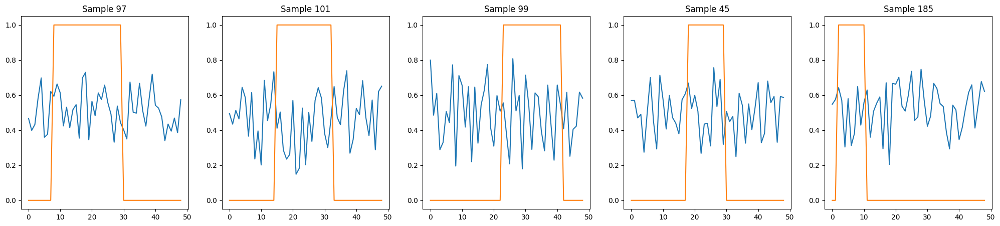

100 0.3971643594810169 tensor(9730.5268, dtype=torch.float64) tensor(4710.1799, dtype=torch.float64) tensor(0.3972, dtype=torch.float64, grad_fn=<MeanBackward0>)


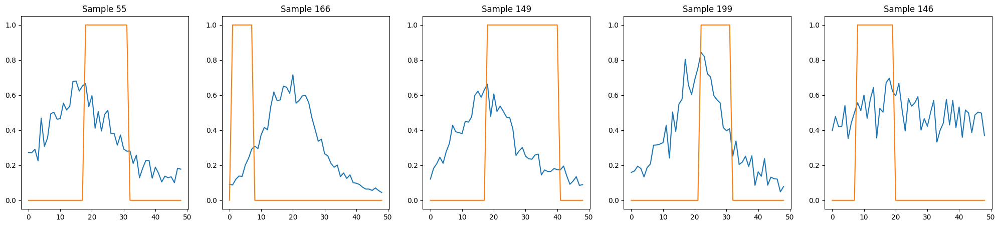

200 0.30362996960861954 tensor(7438.9343, dtype=torch.float64) tensor(4740.3946, dtype=torch.float64) tensor(0.3036, dtype=torch.float64, grad_fn=<MeanBackward0>)


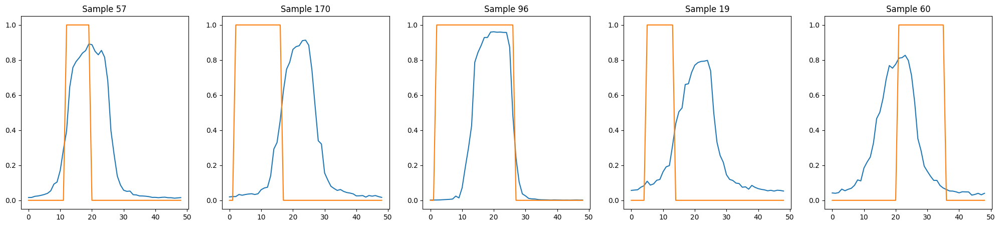

KeyboardInterrupt: 

In [120]:
import torch.nn.functional as F
# dw = DoobleWindowEstimator1D(
#     in_channels=1,
#     out_channels=1,
#     window_size=10,
#     stride=10
# )
criterion = torch.nn.L1Loss()
# optimizer = torch.optim.SGD(dw.parameters(), lr=1e-6)
model = TinyModel()
optimizer = torch.optim.Adam(model.parameters(), weight_decay=.001)
import scipy as sp

for i, (x, y) in enumerate(zip(X, Y)):
    # Forward pass: Compute predicted y by passing x to the model
    # y_pred = s(denser(torch.squeeze(dw(x))))
    # Zero gradients, perform a backward pass, and update the weights.
    optimizer.zero_grad()
    y_pred = model(x)
    # Compute and print loss
    loss = criterion(y_pred, y)
    # l2_lambda = 0.001
    # l2_norm = sum(p.pow(2.0).sum()
    #               for p in dw.parameters())
    # loss = loss + l2_lambda * l2_norm
    if not i % 100:
        fig, axes = plt.subplots(1, 5, figsize=(25, 5))
        error = torch.abs(y_pred - y).sum().data
        squared_error = ((y_pred - y)*(y_pred - y)).sum().data
        print(i, loss.item(), error, squared_error, F.l1_loss(y_pred, y))
        for i, ax in zip(range(5), axes):
            n_sample = np.random.randint(200)
            # ax.plot(sp.stats.zscore(y_pred.detach()[n_sample]))
            # ax.plot(sp.stats.zscore(y[n_sample]))
            ax.plot(y_pred.detach()[n_sample])
            ax.plot(y[n_sample])
            ax.set_title(f'Sample {n_sample}')
        plt.show()
        plt.close()

    loss.backward()
    optimizer.step()

In [258]:
data, labels = gen_random_data(500, 500, 49, 20, 15)
test_data, test_labels = gen_random_data(100, 500, 49, 20, 15)

In [270]:
from torch.utils.data import TensorDataset, DataLoader

tensor_x = torch.Tensor(data) # transform to torch tensor
tensor_y = torch.Tensor(labels)
dataset = TensorDataset(tensor_x,tensor_y) # create your datset
batch_size = 100
val_size = .2
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True) # create your dataloader

In [141]:
tensor_y.shape

torch.Size([5000, 49])

In [295]:
from copy import deepcopy

class EarlyStopper:
    def __init__(self, model, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = np.inf
        self.model = model
        self.best_weights = None

    def __call__(self, validation_loss):
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
            self.best_weights = deepcopy(self.model.state_dict())
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return False
        return True


Epoch 0 loss 0.49827614426612854 val_loss 0.49661728739738464 0


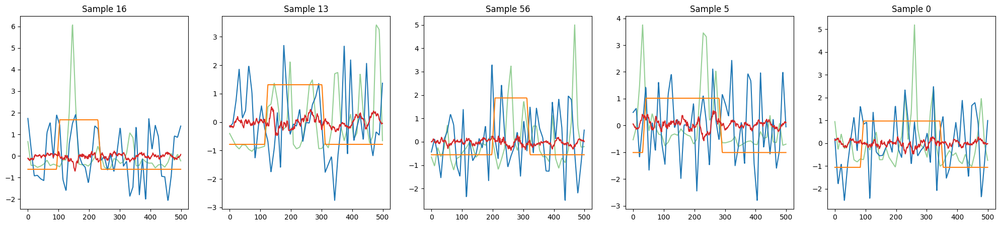

Epoch 10 loss 0.48855385184288025 val_loss 0.4886656403541565 0


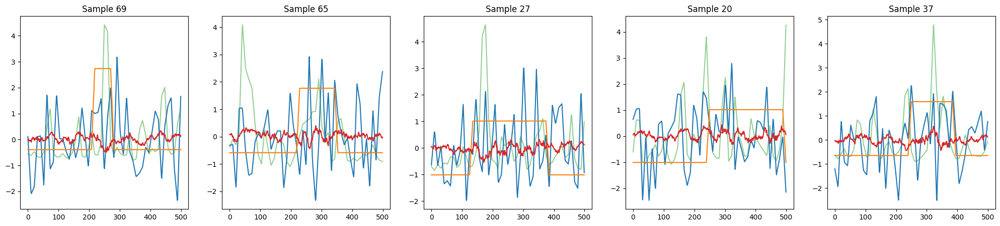

Epoch 20 loss 0.4790552854537964 val_loss 0.4729546904563904 3


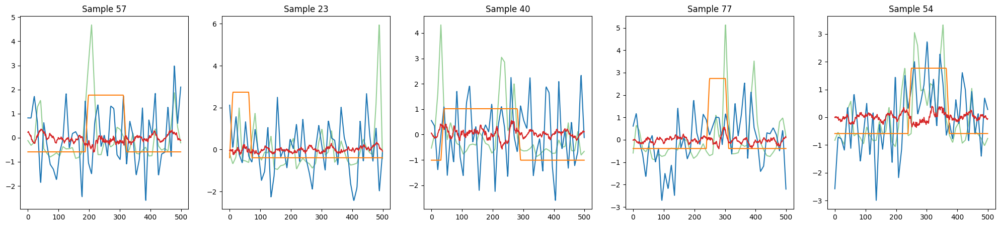

Epoch 30 loss 0.46757930517196655 val_loss 0.4687579274177551 0


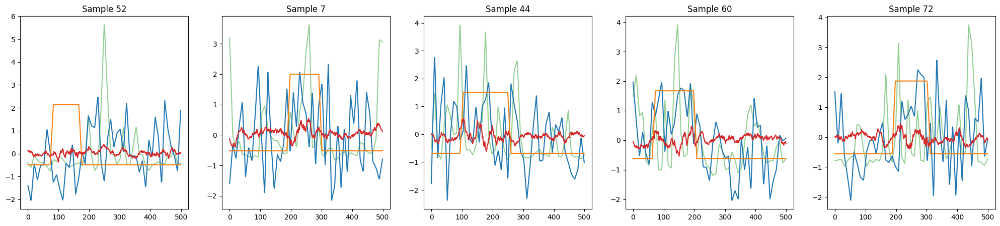

Epoch 40 loss 0.4551562964916229 val_loss 0.4602576792240143 0


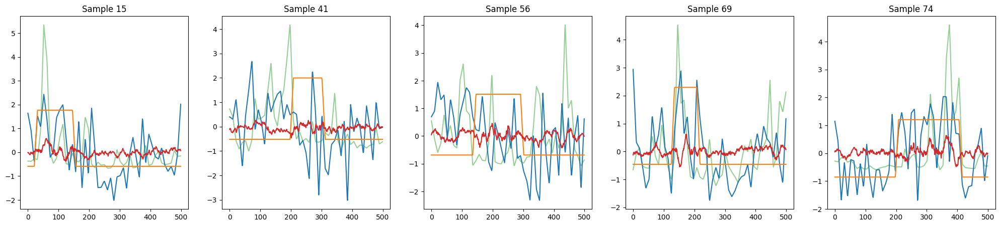

Epoch 50 loss 0.44145604968070984 val_loss 0.45746198296546936 1


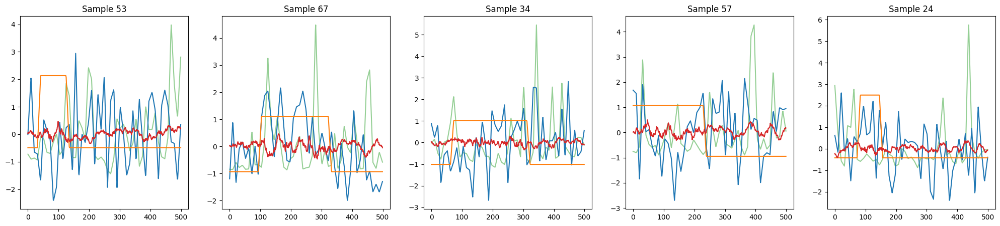

Epoch 60 loss 0.42790183424949646 val_loss 0.4499109387397766 4


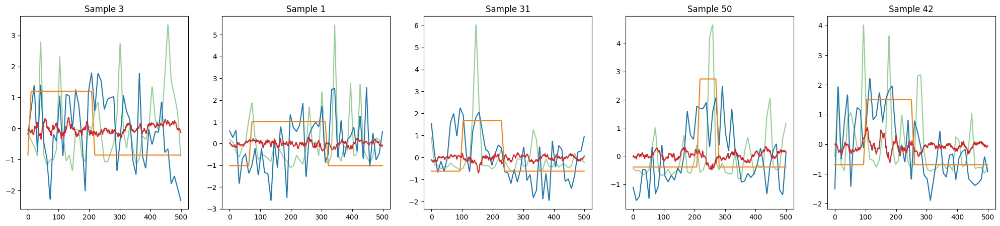

Epoch 70 loss 0.4217441976070404 val_loss 0.4092273414134979 3


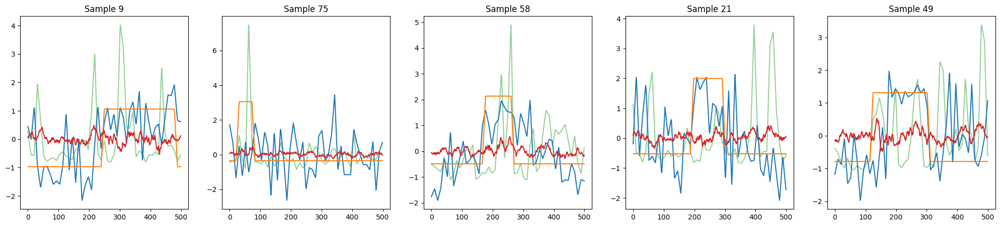

Epoch 80 loss 0.40579143166542053 val_loss 0.4010795056819916 1


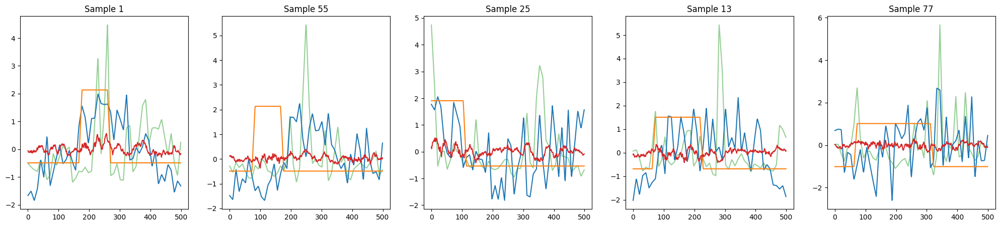

Epoch 90 loss 0.3950308859348297 val_loss 0.3685868978500366 3


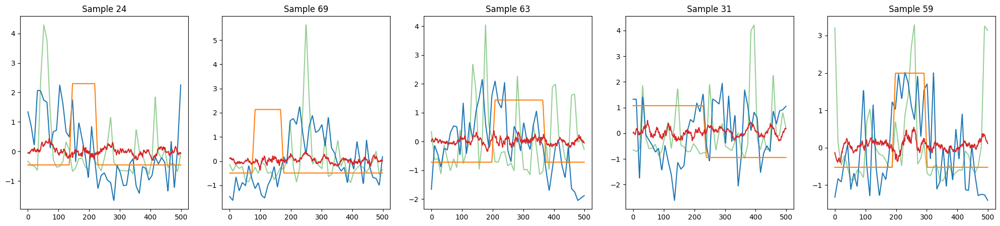

Epoch 100 loss 0.38137876987457275 val_loss 0.3658542037010193 9


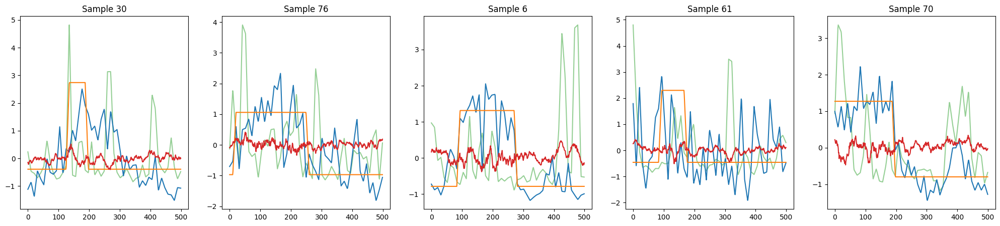

Epoch 110 loss 0.35985100269317627 val_loss 0.35869482159614563 0


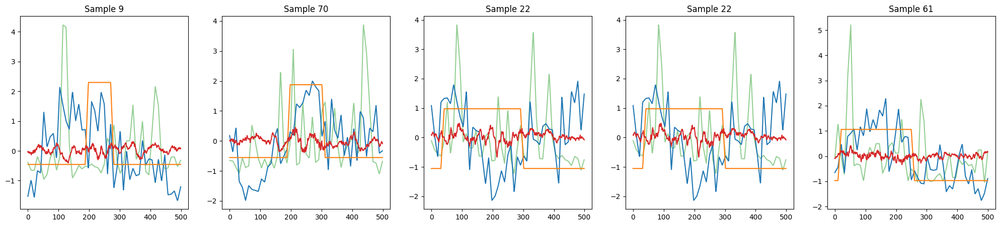

Epoch 120 loss 0.3447795510292053 val_loss 0.3526386618614197 10


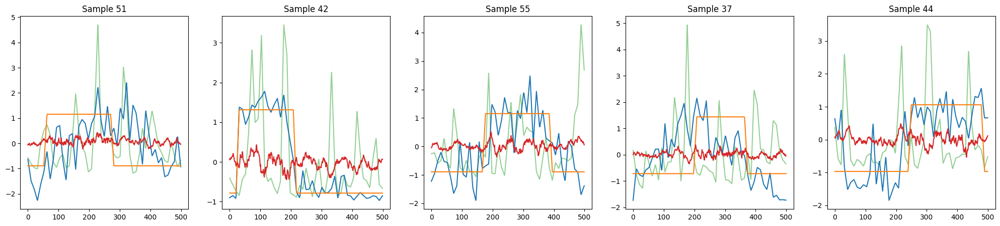

Epoch 130 loss 0.33332952857017517 val_loss 0.3194991648197174 7


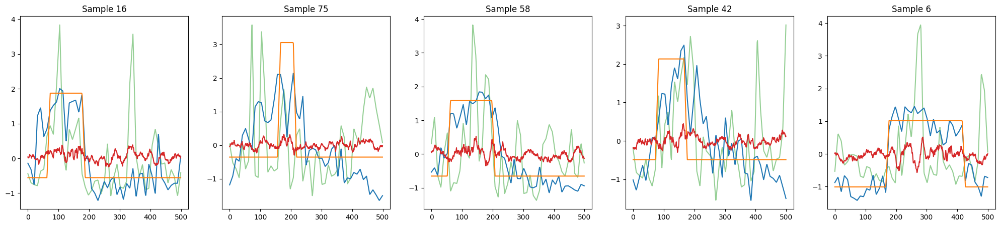

Epoch 140 loss 0.3248055577278137 val_loss 0.29397669434547424 5


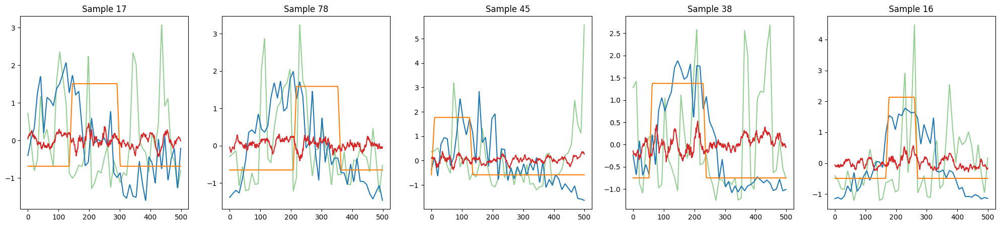

Epoch 150 loss 0.29938945174217224 val_loss 0.3209919333457947 3


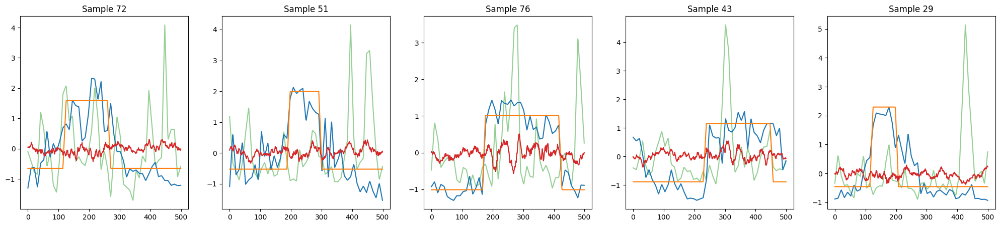

Epoch 160 loss 0.29261741042137146 val_loss 0.2890547215938568 6


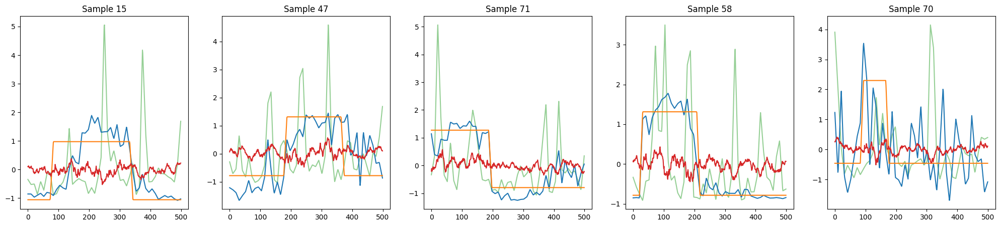

Epoch 170 loss 0.2791244685649872 val_loss 0.28488510847091675 1


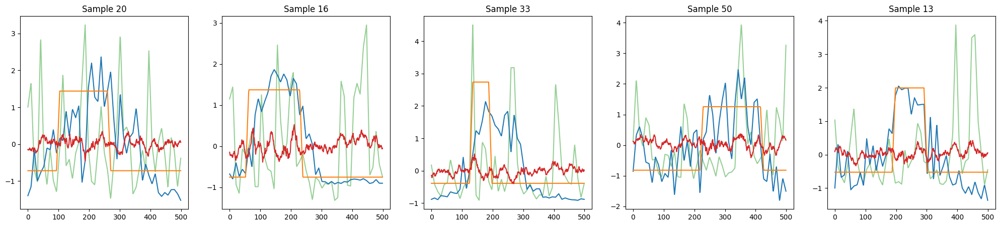

Epoch 180 loss 0.26917919516563416 val_loss 0.27433016896247864 7


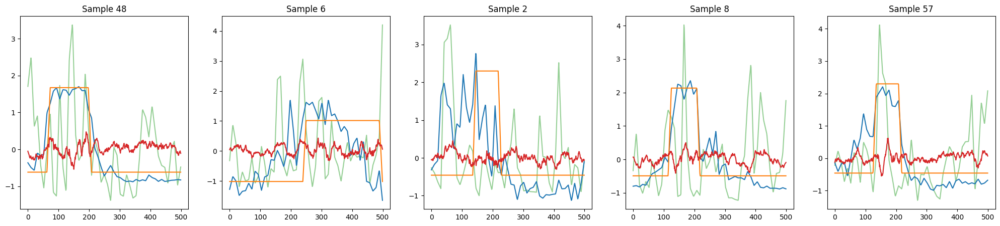

Epoch 190 loss 0.25680074095726013 val_loss 0.2720940411090851 8


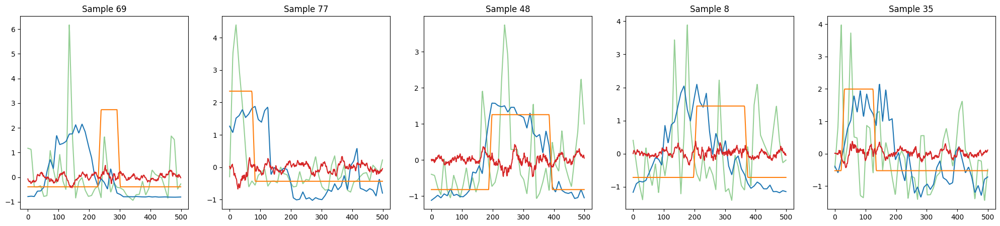

Epoch 200 loss 0.25083622336387634 val_loss 0.2657453119754791 1


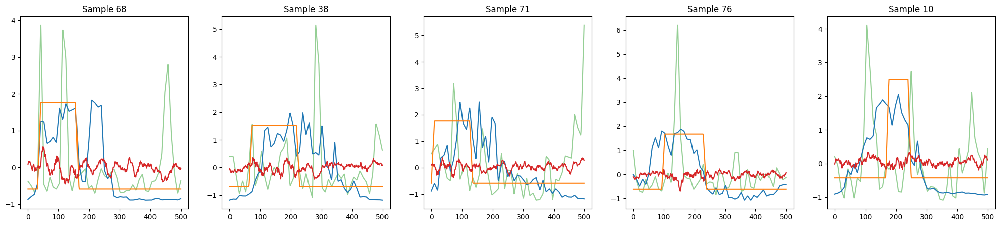

Epoch 210 loss 0.24576810002326965 val_loss 0.23383979499340057 1


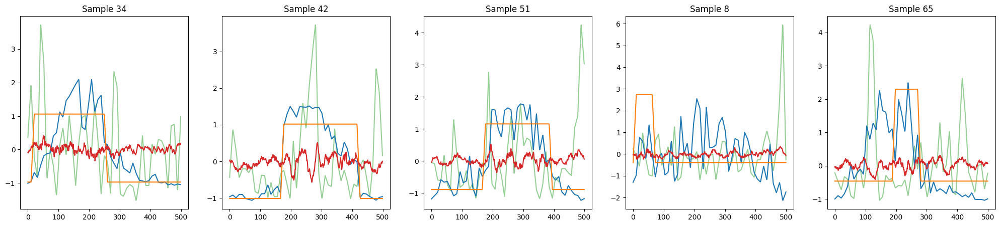

Epoch 220 loss 0.24145172536373138 val_loss 0.2331284135580063 11


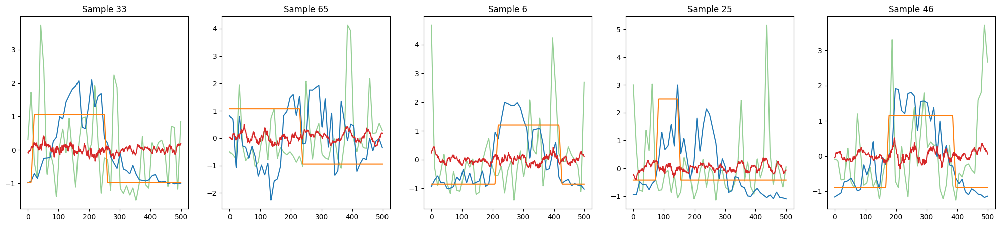

Epoch 230 loss 0.2317965179681778 val_loss 0.23020444810390472 21


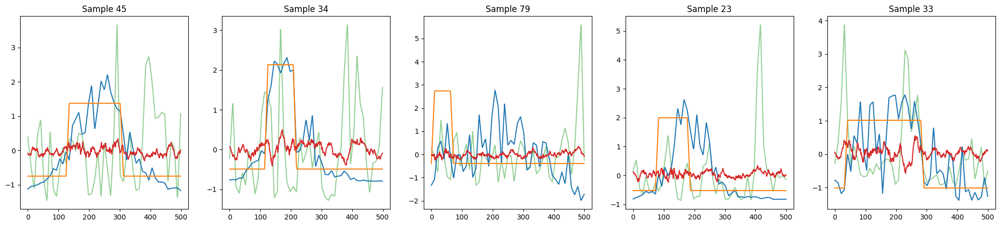

Epoch 240 loss 0.22532889246940613 val_loss 0.2251158356666565 6


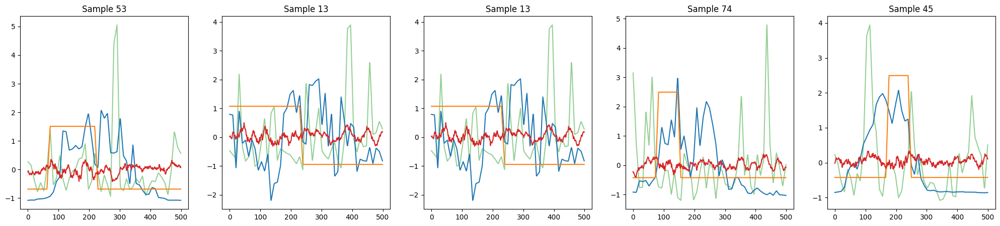

Epoch 250 loss 0.22237548232078552 val_loss 0.2280333787202835 16


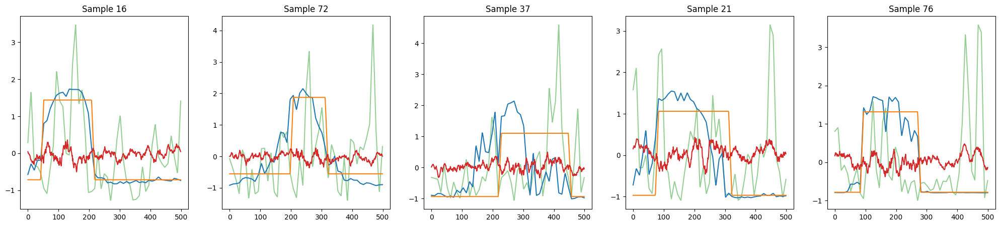

Epoch 260 loss 0.2222484052181244 val_loss 0.18984541296958923 7


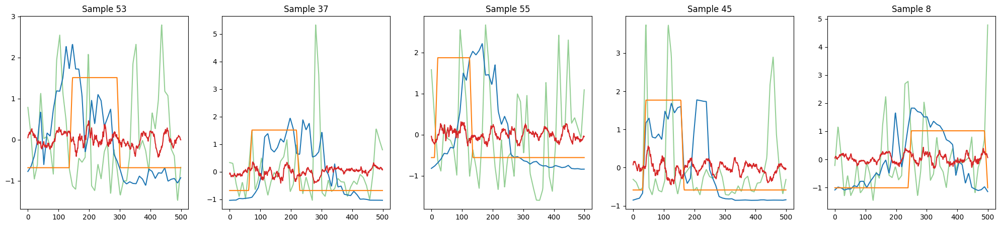

Epoch 270 loss 0.20369620621204376 val_loss 0.2277991771697998 17


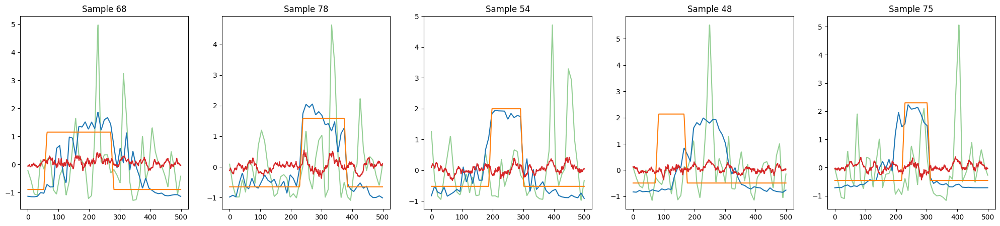

Epoch 280 loss 0.20477840304374695 val_loss 0.2299790233373642 27


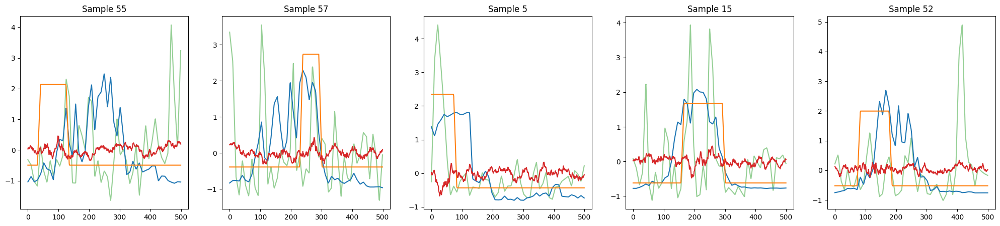

Epoch 290 loss 0.2007744014263153 val_loss 0.20463460683822632 37


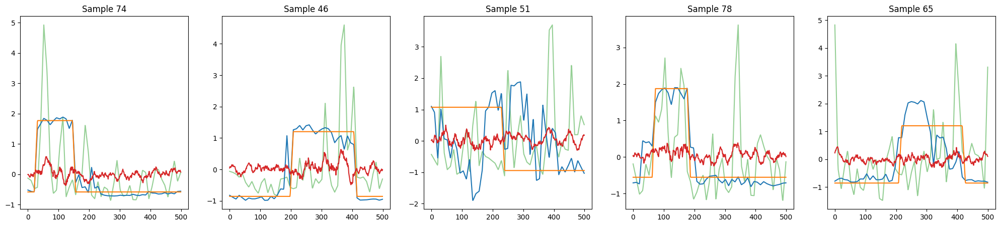

Epoch 300 loss 0.19330550730228424 val_loss 0.22596687078475952 7


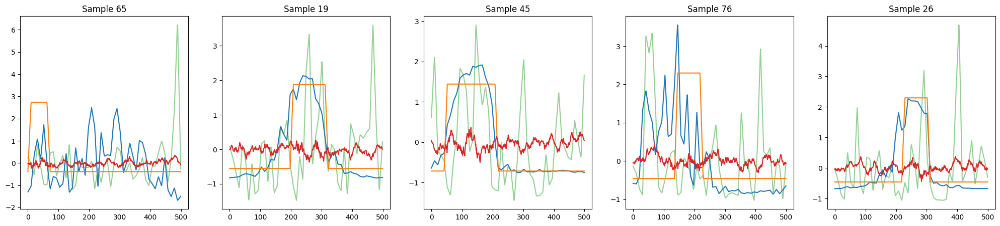

Epoch 310 loss 0.2003491371870041 val_loss 0.20722942054271698 17


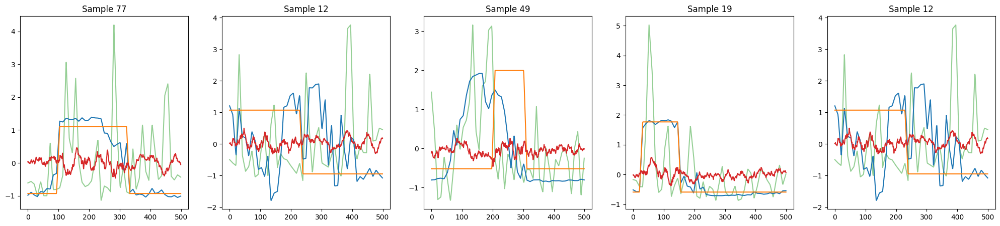

Epoch 320 loss 0.19229751825332642 val_loss 0.20185351371765137 3


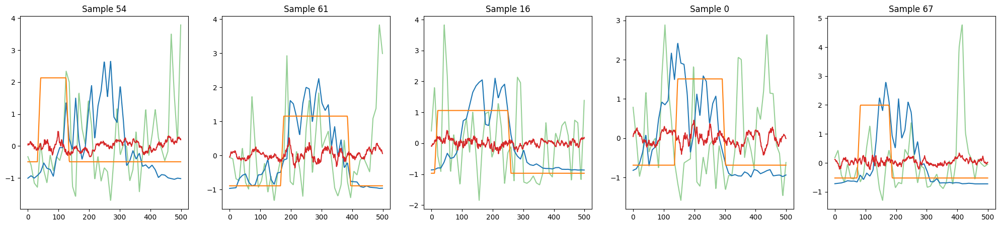

Epoch 330 loss 0.1900312900543213 val_loss 0.19816400110721588 1


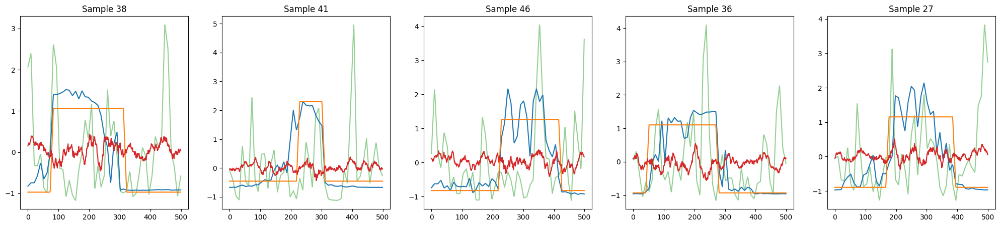

Epoch 340 loss 0.18097862601280212 val_loss 0.2270863950252533 8


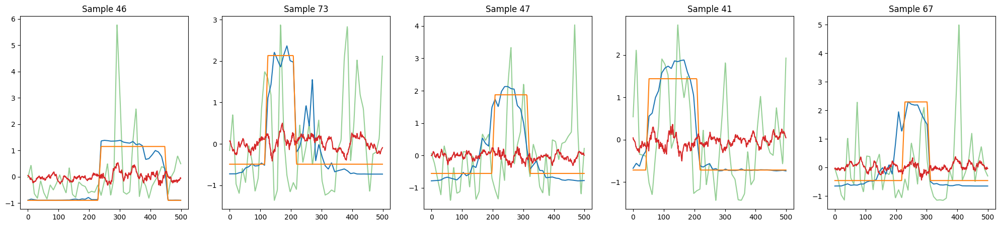

Epoch 350 loss 0.1809609979391098 val_loss 0.2030542939901352 18


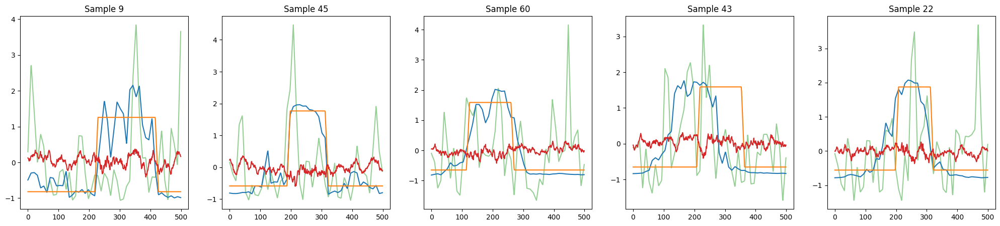

Epoch 360 loss 0.18245051801204681 val_loss 0.17419350147247314 2


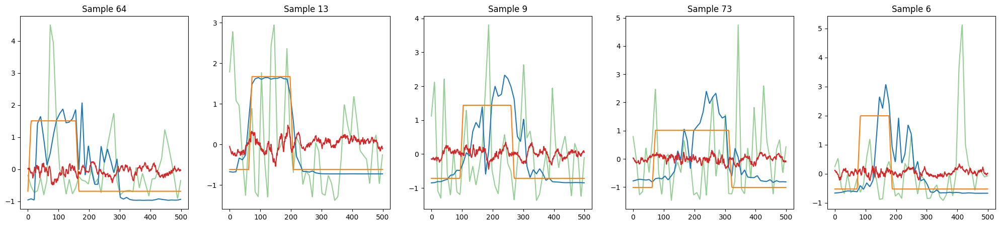

Epoch 370 loss 0.18375501036643982 val_loss 0.1545913964509964 12


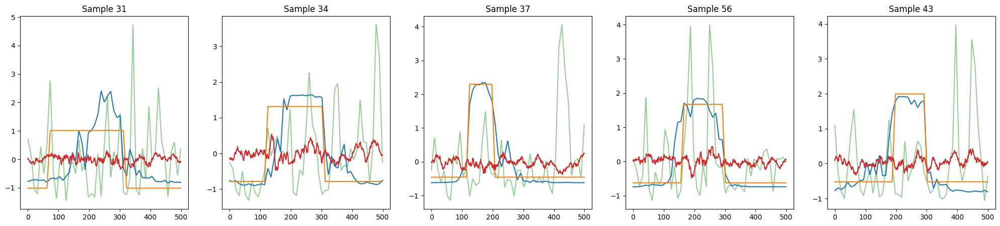

Epoch 380 loss 0.18313756585121155 val_loss 0.14454801380634308 22


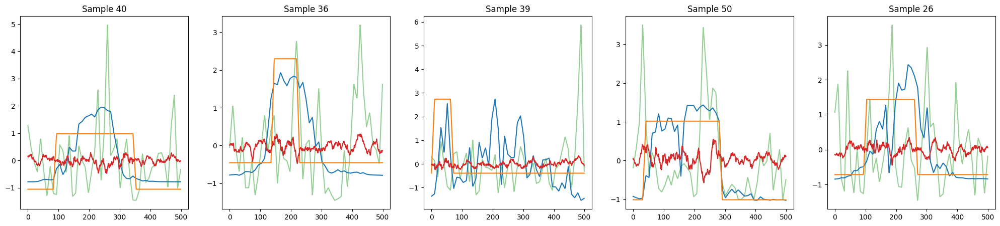

Epoch 390 loss 0.17439229786396027 val_loss 0.1680818796157837 32


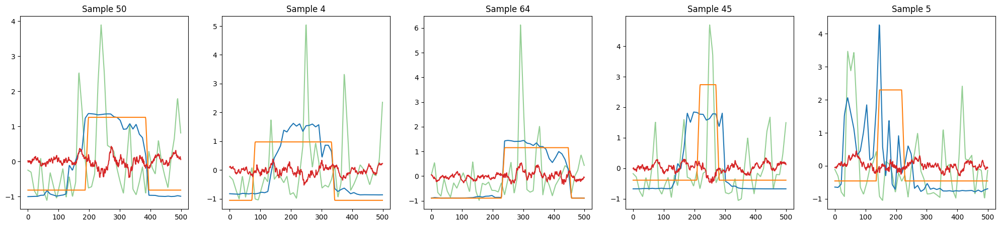

Epoch 400 loss 0.17201387882232666 val_loss 0.18278522789478302 42


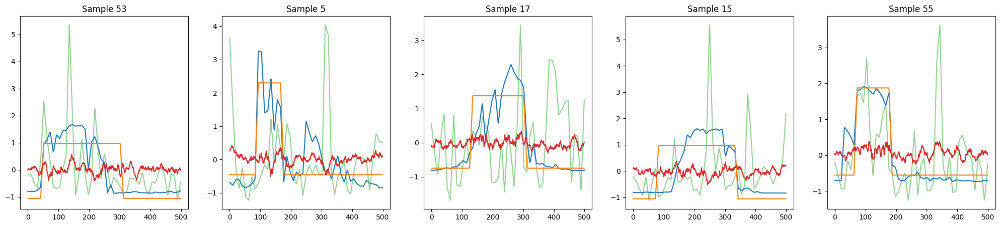

Epoch 407 loss 0.17263467609882355 val_loss 0.15972742438316345 50


In [355]:
criterion = torch.nn.L1Loss()

model = TinyModel()
# optimizer = torch.optim.Adam(model.parameters(), weight_decay=.01)
optimizer = torch.optim.AdamW(model.parameters(), amsgrad=True)

es = EarlyStopper(model, 50)
end = False
val_loss_outer = 0

for n_epoch in range(501):

    for n_batch, (x_trainval, y_trainval) in enumerate(dataloader):
        optimizer.zero_grad()
        x = x_trainval[:-int(val_size*batch_size)]
        y = y_trainval[:-int(val_size*batch_size)]
        x_val = x_trainval[-int(val_size*batch_size):]
        y_val = y_trainval[-int(val_size*batch_size):]
        y_pred = model(x)
        samples = torch.squeeze(x)
        y_curve = model.bn(torch.abs(torch.squeeze(model.dw(x))))
        loss = criterion(y_pred, y)
        loss.backward()
        optimizer.step()
        y_pred_val = model(x_val)
        val_loss = criterion(y_pred_val, y_val)

        if n_batch == 0 and not n_epoch % 10:
            print('Epoch', n_epoch, 'loss', loss.item(), 'val_loss', val_loss.item(), es.counter)
            fig, axes = plt.subplots(1, 5, figsize=(25, 5))
            for i, ax in zip(range(5), axes):
                n_sample = np.random.randint(int(batch_size*(1-val_size)))
                ax.plot(sp.stats.zscore(
                    interpolate_sequence(y_pred.detach()[n_sample], samples.shape[-1])
                ))
                ax.plot(sp.stats.zscore(
                    interpolate_sequence(y[n_sample], samples.shape[-1])
                ))
                ax.plot(sp.stats.zscore(
                    interpolate_sequence(y_curve.detach()[n_sample], samples.shape[-1])
                ), zorder=-1, alpha=.5)
                ax.plot(samples[n_sample])
                ax.set_title(f'Sample {n_sample}')
            plt.show()
            plt.close()

    if not es(val_loss.item()):
        print('Epoch', n_epoch, 'loss', loss.item(), 'val_loss', val_loss.item(), es.counter)
        break



In [356]:
es.min_validation_loss

0.14359745383262634

In [357]:
from torch.utils.data import TensorDataset, DataLoader

tensor_x = torch.Tensor(test_data) # transform to torch tensor
tensor_y = torch.Tensor(test_labels)
dataset = TensorDataset(tensor_x, tensor_y) # create your datset
dataloader = DataLoader(dataset, batch_size=100, shuffle=True) # create your dataloader

In [358]:
i = np.random.randint(100)

x, y = next(iter(dataloader))

y_pred = model(x)
y_curve = model.bn(torch.abs(torch.squeeze(model.dw(x))))
samples = torch.squeeze(x)

In [359]:
criterion(y_pred, y)

tensor(0.1675, grad_fn=<MeanBackward0>)

In [360]:
model.load_state_dict(es.best_weights)

<All keys matched successfully>

In [361]:
i = np.random.randint(100)

x, y = next(iter(dataloader))

y_pred = model(x)
y_curve = model.bn(torch.abs(torch.squeeze(model.dw(x))))
samples = torch.squeeze(x)

In [362]:
criterion(y_pred, y)

tensor(0.1796, grad_fn=<MeanBackward0>)

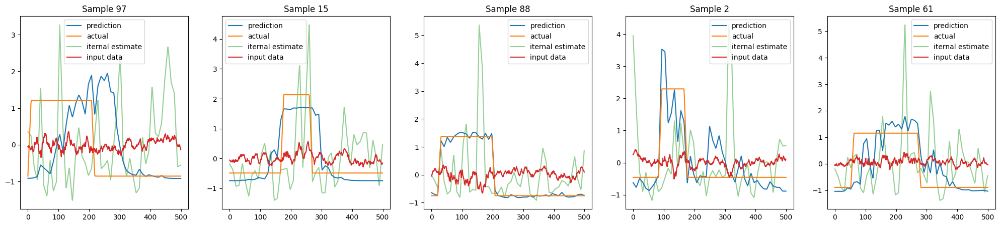

In [372]:
fig, axes = plt.subplots(1, 5, figsize=(25, 5))
for i, ax in zip(range(5), axes):
    n_sample = np.random.randint(100)
    ax.plot(sp.stats.zscore(
        interpolate_sequence(y_pred.detach()[n_sample], samples.shape[-1])
    ))
    ax.plot(sp.stats.zscore(
        interpolate_sequence(y[n_sample], samples.shape[-1])
    ))
    ax.plot(sp.stats.zscore(
        interpolate_sequence(y_curve.detach()[n_sample], samples.shape[-1])
    ), zorder=-1, alpha=.5)
    ax.plot(samples[n_sample])
    # ax.plot(y_pred.detach()[n_sample])
    # ax.plot(y[n_sample])
    ax.set_title(f'Sample {n_sample}')
    ax.legend(['prediction', 'actual', 'iternal estimate', 'input data'])